In [3]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd

import scanpy as sc
import scipy as sp

import sys
import os
sys.path.append(os.path.abspath("./utility_functions"))

import rz_functions as rz
import ng_functions as ng
import rz_utility_spring as srz

from time import time
from seaborn import heatmap

import scrublet as scr

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, roc_curve, auc, precision_recall_curve, f1_score

/home/ng136/miniconda3/envs/py36/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex


python version: 3.6.10


# Data loading, preprocessing and normalization

In [4]:
adata = sc.read_h5ad('backups/tox_marie_all_cells_unnormalized_pca_umap_leiden_35358x22631_backup_200412_21h30.h5ad')

adata[:,['Il12b']].X = adata[:,['Il12b', 'eYFP']].X.sum(1)
adata[:,['eYFP']].X = 0


sc.pp.normalize_total(adata, target_sum=1e4)

adata.obs['n_counts'] = adata.X.sum(1).A1
adata.obs.head()




,barcode,group,library_name,marker,max_mt,min_tot,mito_frac,n_counts,n_genes,pool,tissue,treatment,leiden
48-pool1,AAACAAACAGAGGATAAGACACCA,B,Liver_CD45pos_NT_B,CD45pos,0.15,200,0.040964,10000.000977,348,pool1,Liver,NT,8
98-pool1,AAACAAACAGAGGATACAATACTT,B,Liver_CD45pos_NT_B,CD45pos,0.15,200,0.005613,10000.000000,581,pool1,Liver,NT,20
237-pool1,AAACAAACAGAGGATAGGCCCTTA,B,Liver_CD45pos_NT_B,CD45pos,0.15,200,0.035451,10000.001953,470,pool1,Liver,NT,11
246-pool1,AAACAAACAGAGGATAGGGAGGTA,B,Liver_CD45pos_NT_B,CD45pos,0.15,200,0.018000,10000.000000,374,pool1,Liver,NT,16
342-pool1,AAACAAACAGAGGATATGGCTACC,B,Liver_CD45pos_NT_B,CD45pos,0.15,200,0.035088,10000.000000,318,pool1,Liver,NT,6


In [5]:
#loglikelihoods = sp.sparse.load_npz('backups/loglikelihoods_bay_classif_tox_marie_all_cells_200407_11h02.npz')
logls = np.load('backups/loglikelihoods_bay_classif_tox_marie_all_cells_200407_11h02.npz', allow_pickle=True)

mostlikely_subset = pd.DataFrame(logls['data'], index=logls['index'], columns=logls['columns']).idxmax()
mostlikely_subset = pd.Series(mostlikely_subset, dtype='category')
mostlikely_subset.index = adata.obs.index

mostlikely_celltype = mostlikely_subset.map(ng.cell_subset_dict).astype('category')

In [6]:
adata.obs['cell_type'] = mostlikely_celltype
adata.obs['minor_subset'] = mostlikely_subset

#annotate color palette in adata.uns
adata.uns['cell_type_colors'] = adata.obs['cell_type'].cat.categories.map(ng.cell_type_cmap).tolist()
adata.uns['minor_subset_colors'] = adata.obs['minor_subset'].cat.categories.map(ng.cell_subset_cmap).tolist()

adata_Z = sc.pp.scale(adata, copy=True)

In [7]:
m2_genes = ng.filter_genelist(['Ptgs1',
                                 'Egr2',
                                 'Olfm1',
                                 'Flrt2',
                                 'P2ry1',
                                 'Vwf',
                                 'Amz1',
                                 'Tmem158',
                                 'Tiam1',
                                 'Rhoj',
                                 'Mmp9',
                                 'Mrc1',
                                 'Bcar3',
                                 'Il6st',
                                 'Tanc2',
                                 'Mmp12',
                                 'Tcfec',
                                 'Clec71',
                                 'Matk',
                                 'Myc',
                                 'Clec10a',
                                 'Atp6v0a1',
                                 'Lmna',
                                 'Chst7',
                                 'Atp6v0d2',
                                 'Emp2',
                                 'Socs6',
                                 'Atp6v0a1',
                                 'Plk2',
                                 'Ptpla'],adata)

m1_genes = ng.filter_genelist(['Cd38',
                                 'Cfb',
                                 'Slfn4',
                                 'H2-Q6',
                                 'Fpr1',
                                 'Slfn1',
                                 'Gpr18',
                                 'Ccrl2',
                                 'Fpr2',
                                 'Cxcl10',
                                 'Mpa2IOasl1',
                                 'Tlr2',
                                 'Ms4a4c',
                                 'LOC100503664',
                                 'Irak3',
                                 'Hp',
                                 'Itgal',
                                 'Herc6',
                                 'Cd300lf',
                                 'Isf20',
                                 'Pstpip2',
                                 'Cp',
                                 'Isg15',
                                 'Herc6',
                                 'Probe',
                                 '1452408_at',
                                 'Ifi44',
                                 'E030037K03',
                                 'Rik',
                                 'Saa3',
                                 'Ifit1',
                                 'Marco',
                                 'F11r',
                                 'Rsad2',
                                 'Ddx60',
                                 'Pilr1',
                                 'Cpd',
                                 'Gngt2',
                                 'Mx1',
                                 'Pyhin1',
                                 'Epb4.1l3',
                                 'Slfn8',
                                 'Arhgap24',
                                 'Nfkbiz',
                                 'Gbp6',
                                 'Stat1',
                                 'Zpb1',
                                 'D14Erd668e',
                                 'Ddx58',
                                 'Tuba4a',
                                 'H2-T10',
                                 'Ebi3',
                                 'Fam176b',
                                 'Xaf1',
                                 'Stat2',
                                 'Sepx1',
                                 'Ifit2'], adata)

#ng.filter_genelist(['Ccr5', 'Cd4'], adata)

In [16]:
marker_gene_dict = {'pDC' : ['Ccr5', 'Cd4'],
                    'Dendritic cells': ['Flt3', 'Tbc1d4', 'Ccr7'],
                    #'Monocytes' : ['Cd14'],
                    'Macrophages': ['C1qa', 'Apoe', 'Marco', 'Axl'],
                    #'M1' : m1_genes,
                    #'M2' : m2_genes,
                    'Kupffer cells': ['Timd4', 'Clec4f', 'Adgre1'],
                    'B cells': ['Cd19', 'Blk'],
                    'T cells': ['Cd3g', 'Cd3d', 'Cd28'],
                    'CTL': ['Klrg1', 'Cd8a'],
                    'Exhausted CTL' : ['Lag3', 'Eomes'],
                    'Th cells': ['Cd4'],
                    'Treg cells' : ['Foxp3'],
                    'NK cells': ['Xcl1', 'Ncr1', 'Klrb1', 'Nkg7'],
                    'Myeloid' : ['Cst3'],
                    'Neutrophils': ['Fpr1', 'Csf3r', 'Ceacam3', 'Ly6g'],
                    'Basophils' : ['Il3ra'],
                    #'Leukocytes' : ['Ptprc'],
                    #'Cluster 8 (Endothelium)' : ['Ptprb', 'Clec4g', 'Eng', 'Il6st', 'Sparc', 'Gpr182', 'Tpbgl', 'Kdr', 'Egfl7'],
                    'Cluster 8 + 22'           : ['Ptprb', 'Kdr', 'Clec4g', 'Il6st', 'Flt4', 'Sparc', 'Fcgr2b', 'Ehd3', 'Eng']}
                    #'Cluster 1' : ['Ms4a6c', 'Lyz2', 'Fpr2', 'Fth1', 'Ctsc', 'Saa3', 'Lpl', 'Ly6i','Calr'],
                    #'Cluster 1+2' : ['Ms4a6c', 'Fth1', 'Tgfbi', 'Lgals3', 'Lyz2', 'C1qc', 'Tpi1', 'Ctsc', 'C1qb'],
                    #'Clusters 1+2+16+23' : ['Ms4a6c', 'Tgfbi', 'Fth1', 'Lyz2', 'Ctsc', 'C1qb', 'Csf1r', 'Sirpa', 'Lgals3']}

marker_genes = sum([*marker_gene_dict.values()], [])

print([x in adata.var_names for x in marker_genes])
print(np.all([x in adata.var_names for x in marker_genes]))

[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True]
True


In [9]:
#adata_Z[:, >1]
random_subset = np.array(50*[True]+(adata.n_obs - 50)*[False])
np.random.shuffle(random_subset)
#np.random.shuffle()
X = adata_Z[:,adata_Z.varm['highly_variable']].X
y = adata.obs.leiden.isin(['8','22']).astype(int)

In [10]:
#X = adata_Z[:,adata_Z.varm['highly_variable']]
#y = (adata.obs.leiden == '8').astype(int)

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.1)
rf = RandomForestClassifier(random_state = 1, max_features = 5)

rf.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features=5,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=1, verbose=0,
                       warm_start=False)

# Classifier performance metrics

In [11]:
y_probs_train = rf.predict_proba(X_train)[:,1]
fpr_train, tpr_train, thresholds_train = roc_curve(y_train, y_probs_train)
precision_train, recall_train, _tr = precision_recall_curve(y_train, y_probs_train)
rf_f1_train = f1_score(y_train,rf.predict(X_train))

y_probs_test = rf.predict_proba(X_test)[:,1]
fpr_test, tpr_test, thresholds_test = roc_curve(y_test, y_probs_test)
precision_test, recall_test, _ = precision_recall_curve(y_test, y_probs_test)
rf_f1_test = f1_score(y_test,rf.predict(X_test))


# Classifier performance

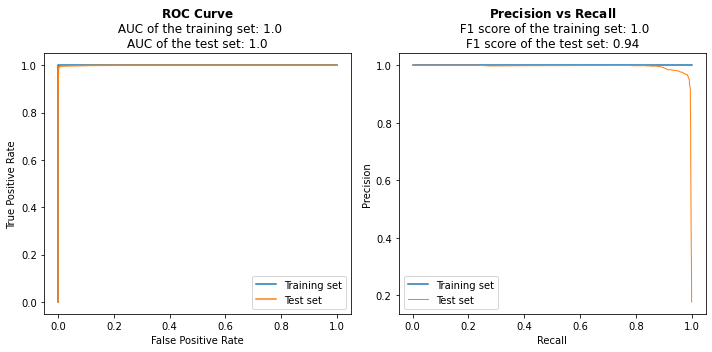

In [12]:
fig, axes = plt.subplots(1,2,figsize=(10,5))

axes[0].plot(fpr_train,tpr_train,label='Training set')
axes[0].plot(fpr_test,tpr_test,label='Test set')


axes[0].set_xlabel('False Positive Rate')
axes[0].set_ylabel('True Positive Rate')
axes[0].set_title( r'$\bf{ROC\ Curve}$' + '\n AUC of the training set: {}\nAUC of the test set: {}'.format(round(auc(fpr_train,tpr_train),2),round(auc(fpr_test,tpr_test),2)))
axes[0].legend()

axes[1].plot(recall_train,precision_train,label='Training set')
axes[1].plot(recall_test,precision_test,label='Test set',linewidth=1)

axes[1].set_ylabel('Precision')
axes[1].set_xlabel('Recall')
axes[1].set_title( r'$\bf{Precision\ vs\ Recall}$' + '\n F1 score of the training set: {}\nF1 score of the test set: {}'.format(round(rf_f1_train,2),round(rf_f1_test,2)))
axes[1].legend()

plt.subplots_adjust(wspace=0.5,hspace=.25)
plt.tight_layout()

plt.show()

In [13]:
#rf.feature_importances_[np.argsort(rf.feature_importances_)[-1:-10:-1]]

In [14]:
adata_Z[:,adata_Z.varm['highly_variable']].var.index[np.argsort(rf.feature_importances_)[-1:-10:-1]]

Index(['Ptprb', 'Kdr', 'Egfl7', 'Il6st', 'Flt4', 'Igfbp7', 'Gpr182', 'Eng',
       'Ehd3'],
      dtype='object')

categories: 0, 1, 2, etc.
var_group_labels: pDC, Dendritic cells, Macrophages, etc.


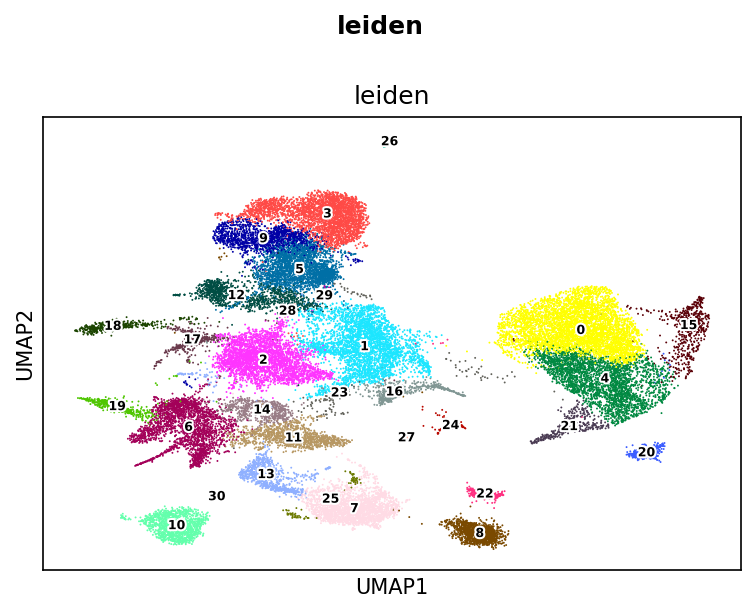

<Figure size 1728x864 with 0 Axes>

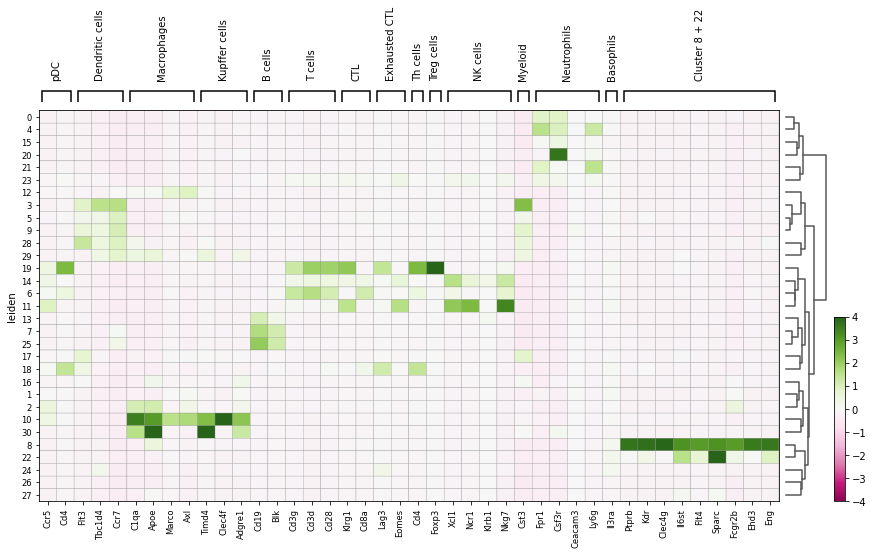

GridSpec(2, 3, height_ratios=[0.5, 10], width_ratios=[13.44, 0.8, 0.2])

In [17]:
#fig, axes = plt.subplots(1,2)
ng.umap_plot(adata, color='leiden', save_fig=False, dpi_show=150)
plt.figure(figsize=(24,12))
sc.pl.matrixplot(adata_Z, marker_gene_dict, groupby='leiden', dendrogram=True, vmin=-4, vmax = 4, cmap='PiYG')

In [94]:
np.max(adata_Z.X)

188.03192

In [30]:
print([x in adata.var_names for x in nk_genes])

!mkdir -p figures/leiden_annotation/macrophages
!mkdir -p figures/leiden_annotation/dendritic
!mkdir -p figures/leiden_annotation/kupffer
!mkdir -p figures/leiden_annotation/bcells
!mkdir -p figures/leiden_annotation/tcells
!mkdir -p figures/leiden_annotation/cd8t
!mkdir -p figures/leiden_annotation/thelper
!mkdir -p figures/leiden_annotation/nk
!mkdir -p figures/leiden_annotation/neutrophils





[True, True, True]


# Mac benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/macrophages/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_C1qa_Apoe_Marco_Axl_200417_02h41_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/macrophages/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_C1qa_Apoe_Marco_Axl_200417_02h41_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/macrophages/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_C1qa_Apoe_Marco_Axl_200417_02h41_3.pdf done!
figures/leiden_annotation/macrophages/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_C1qa_Apoe_Marco_Axl_200417_02h41_4.pdf done!
34.69116020202637


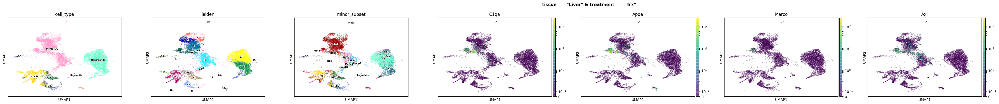

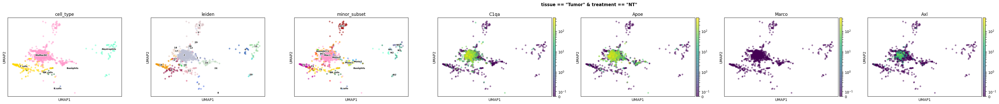

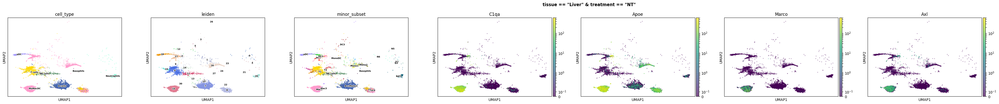

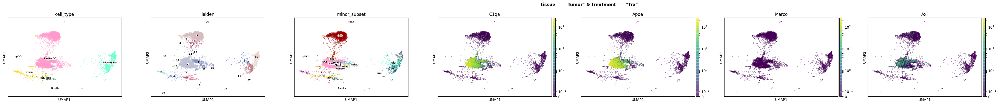

In [10]:
start = time()
fig_mac_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/macrophages', color=['cell_type', 'leiden', 'minor_subset', *marker_gene_dict['Macrophages']], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# DC benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/dendritic/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Flt3_Tbc1d4_Ccr7_200417_02h42_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/dendritic/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Flt3_Tbc1d4_Ccr7_200417_02h42_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/dendritic/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Flt3_Tbc1d4_Ccr7_200417_02h42_3.pdf done!
figures/leiden_annotation/dendritic/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Flt3_Tbc1d4_Ccr7_200417_02h42_4.pdf done!
30.725237131118774


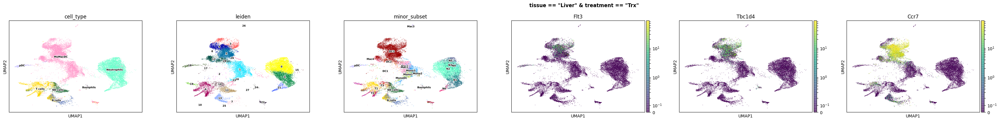

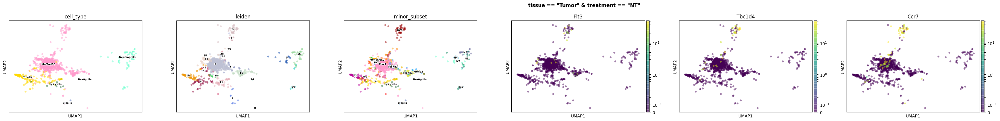

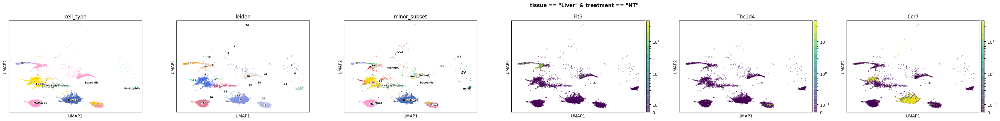

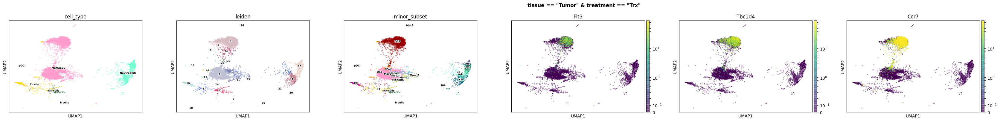

In [11]:
start = time()
fig_dc_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/dendritic', color=['cell_type', 'leiden', 'minor_subset', *marker_gene_dict['Dendritic cells']], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# KC benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/kupffer/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Timd4_Clec4f_Adgre1_200417_02h43_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/kupffer/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Timd4_Clec4f_Adgre1_200417_02h43_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/kupffer/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Timd4_Clec4f_Adgre1_200417_02h43_3.pdf done!
figures/leiden_annotation/kupffer/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Timd4_Clec4f_Adgre1_200417_02h43_4.pdf done!
29.78529381752014


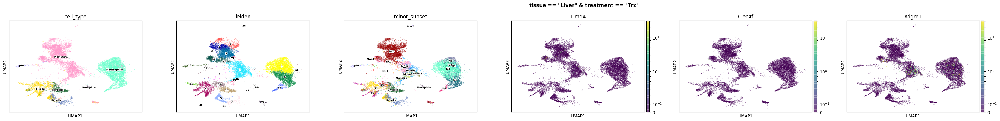

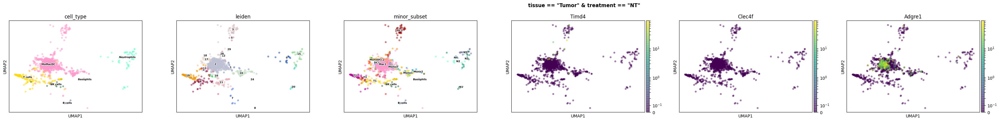

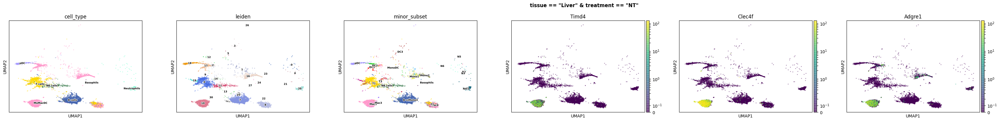

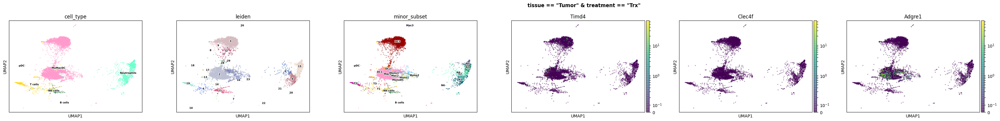

In [12]:
start = time()
fig_kc_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/kupffer', color=['cell_type', 'leiden', 'minor_subset', *marker_gene_dict['Kupffer cells']], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# B cell benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/bcells/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Cd19_Blk_200417_20h00_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/bcells/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Cd19_Blk_200417_20h00_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/bcells/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Cd19_Blk_200417_20h00_3.pdf done!
figures/leiden_annotation/bcells/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Cd19_Blk_200417_20h00_4.pdf done!
22.6158447265625


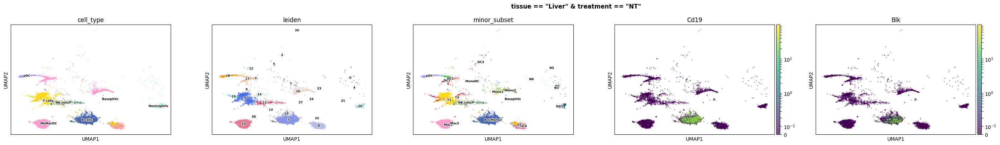

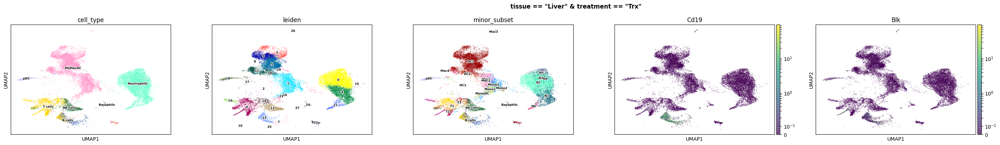

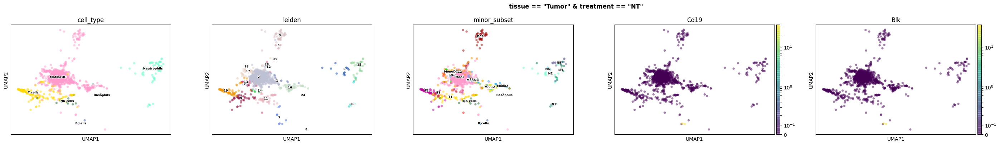

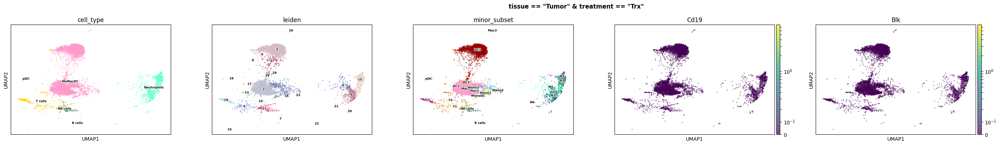

In [24]:
start = time()
fig_bc_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/bcells', color=['cell_type', 'leiden', 'minor_subset', *marker_gene_dict['B cells']], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# T cell benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/tcells/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Cd3g_Cd3d_Cd28_200417_02h44_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/tcells/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Cd3g_Cd3d_Cd28_200417_02h44_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/tcells/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Cd3g_Cd3d_Cd28_200417_02h44_3.pdf done!
figures/leiden_annotation/tcells/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Cd3g_Cd3d_Cd28_200417_02h44_4.pdf done!
29.855016946792603


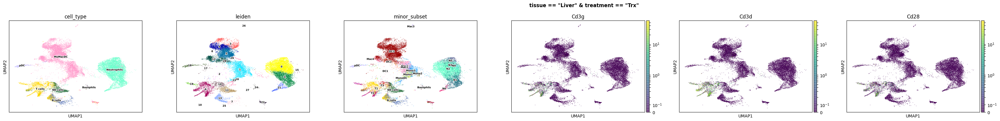

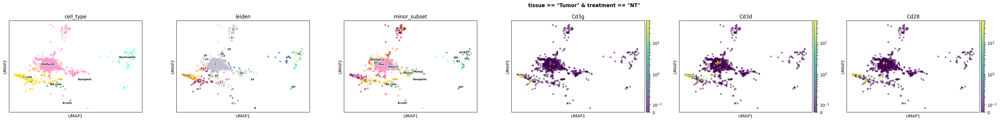

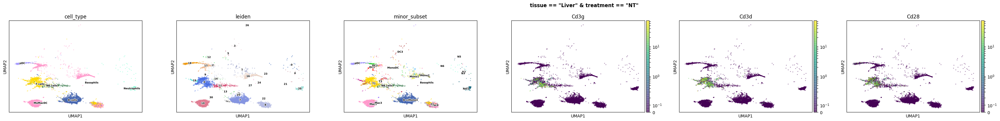

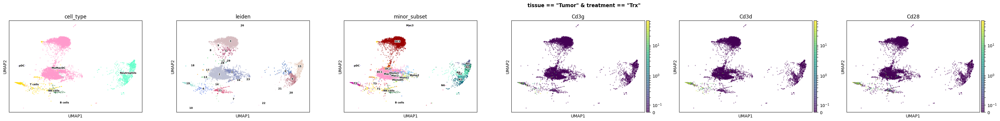

In [14]:
start = time()
fig_tc_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/tcells', color=['cell_type', 'leiden', 'minor_subset', *marker_gene_dict['T cells']], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# Cytotoxic T cell benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/cd8t/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Klrg1_Cd8a_200417_02h44_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/cd8t/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Klrg1_Cd8a_200417_02h44_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/cd8t/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Klrg1_Cd8a_200417_02h45_3.pdf done!
figures/leiden_annotation/cd8t/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Klrg1_Cd8a_200417_02h45_4.pdf done!
24.26480531692505


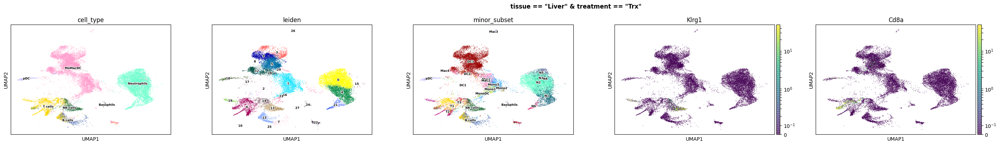

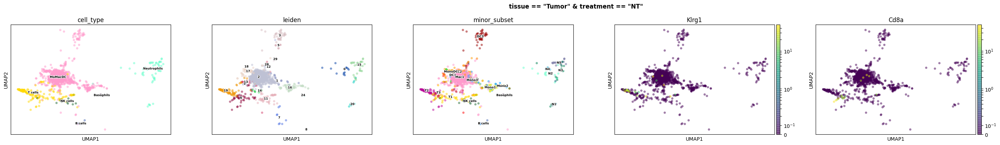

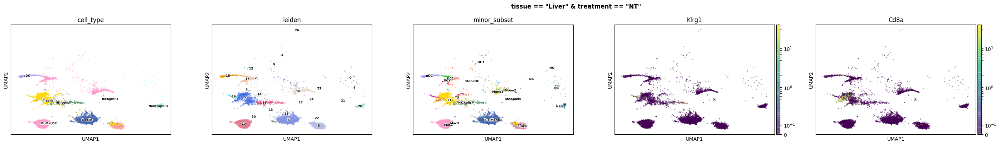

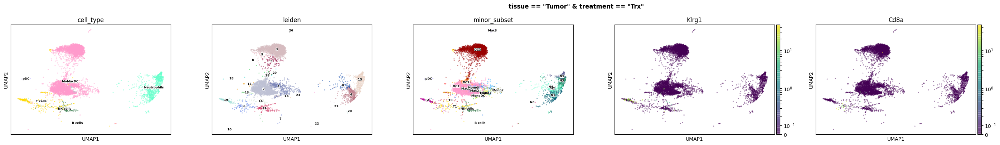

In [16]:
start = time()
fig_cd8t_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/cd8t', color=['cell_type', 'leiden', 'minor_subset', *marker_gene_dict['CTL']], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# T helper cell benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/thelper/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Cd4_200417_02h46_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/thelper/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Cd4_200417_02h46_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/thelper/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Cd4_200417_02h46_3.pdf done!
figures/leiden_annotation/thelper/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Cd4_200417_02h46_4.pdf done!
18.99437189102173


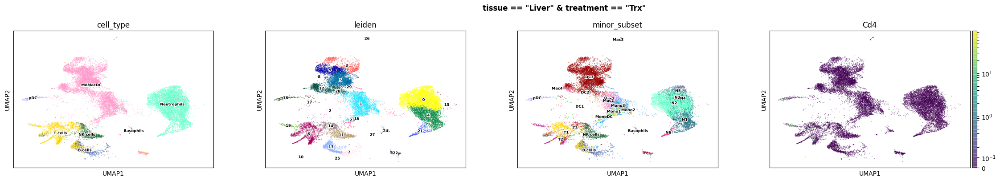

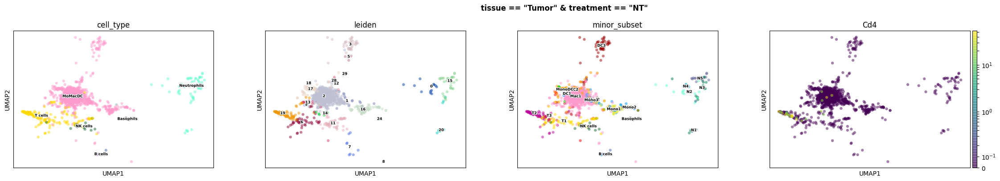

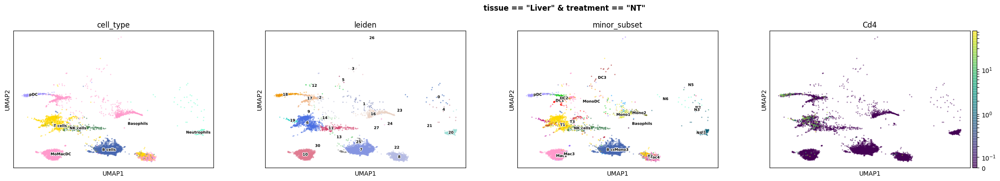

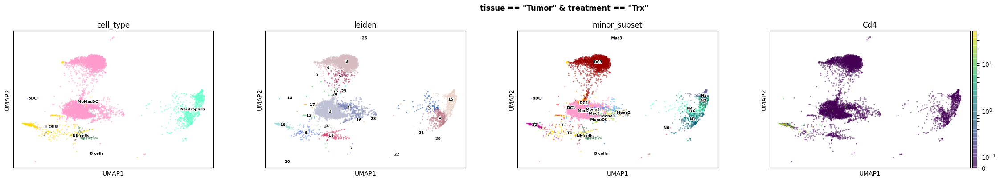

In [18]:
start = time()
fig_th_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/thelper', color=['cell_type', 'leiden', 'minor_subset', *marker_gene_dict['Th cells']], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# NK cell benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/nk/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Xcl1_Ncr1_Klrb1_200417_20h06_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/nk/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Xcl1_Ncr1_Klrb1_200417_20h06_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/nk/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Xcl1_Ncr1_Klrb1_200417_20h06_3.pdf done!
figures/leiden_annotation/nk/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Xcl1_Ncr1_Klrb1_200417_20h06_4.pdf done!
27.882911682128906


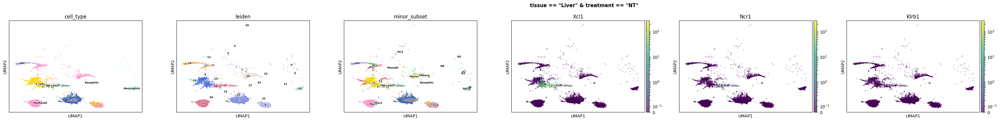

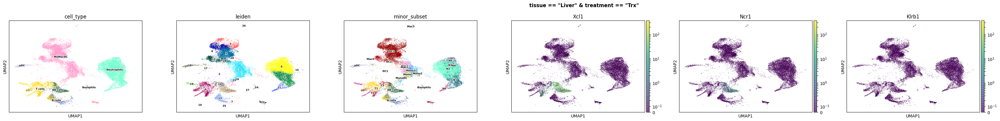

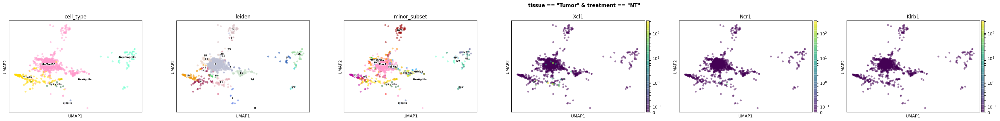

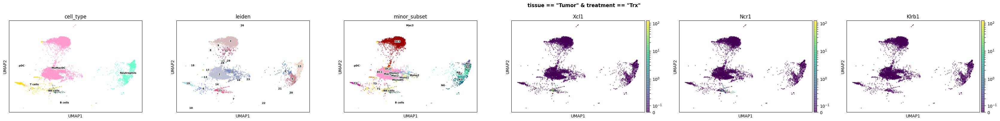

In [31]:
start = time()
fig_nk_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/nk', color=['cell_type', 'leiden', 'minor_subset', *marker_gene_dict['NK cells']], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# Neutrophils benchmarking

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/neutrophils/tissue_Liver_treatment_NT_by_cell_type_leiden_minor_subset_Fpr1_Csf3r_Ceacam3_Ly6g_200417_20h01_1.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/neutrophils/tissue_Liver_treatment_Trx_by_cell_type_leiden_minor_subset_Fpr1_Csf3r_Ceacam3_Ly6g_200417_20h01_2.pdf done!


Trying to set attribute `.uns` of view, copying.


figures/leiden_annotation/neutrophils/tissue_Tumor_treatment_NT_by_cell_type_leiden_minor_subset_Fpr1_Csf3r_Ceacam3_Ly6g_200417_20h01_3.pdf done!
figures/leiden_annotation/neutrophils/tissue_Tumor_treatment_Trx_by_cell_type_leiden_minor_subset_Fpr1_Csf3r_Ceacam3_Ly6g_200417_20h02_4.pdf done!
33.27552127838135


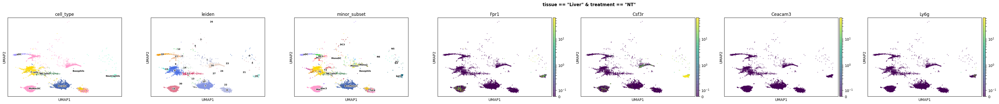

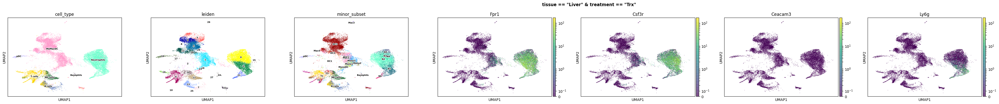

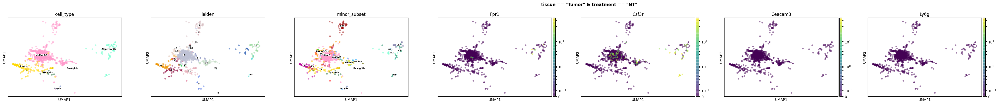

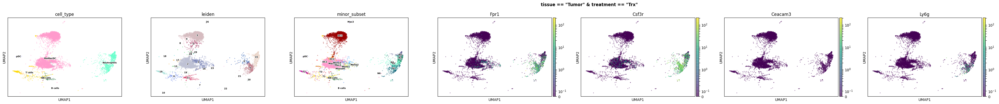

In [25]:
start = time()
fig_neu_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/neutrophils', color=['cell_type', 'leiden', 'minor_subset', *marker_gene_dict['Neutrophils']], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

# T cell benchmarking

In [ ]:
start = time()
fig_tc_genes = ng.umap_plot(adata, folder='figures/leiden_annotation/tc', color=['cell_type', 'leiden', 'minor_subset', *neu_genes], return_fig=True, save_fig=True, alpha=0.5, ncols=7, split_by_cats=['tissue', 'treatment'])
print(time() - start)

In [ ]:
ng.umap_plot(adata, folder='figures/leiden_annotation', color=['Il12b', 'Batf3', 'leiden'], return_fig=True, save_fig=False, alpha=0.5, ncols=3, split_by_cats=['tissue', 'treatment'])


In [ ]:
ng.umap_plot(adata, folder='figures/leiden_annotation', color=['minor_subset', 'leiden', 'Cd19'], return_fig=True, save_fig=False, alpha=0.5, ncols=4, split_by_cats=['tissue', 'treatment'])


In [ ]:
'Cd3a' in adata.var_names

Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.
Trying to set attribute `.uns` of view, copying.


[<Figure size 2061x400 with 4 Axes>,
 <Figure size 2061x400 with 4 Axes>,
 <Figure size 2061x400 with 4 Axes>,
 <Figure size 2061x400 with 4 Axes>]

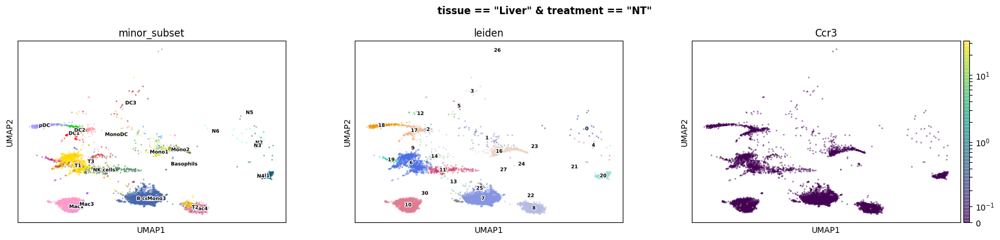

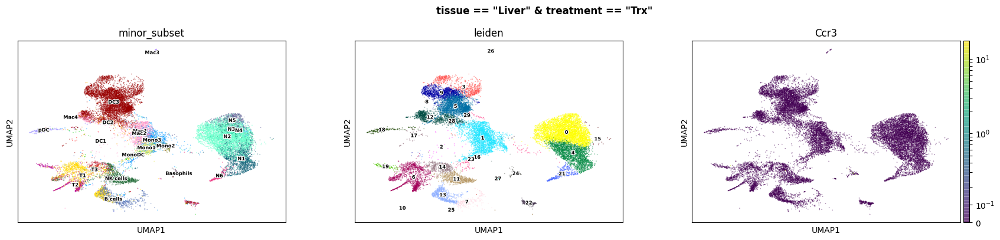

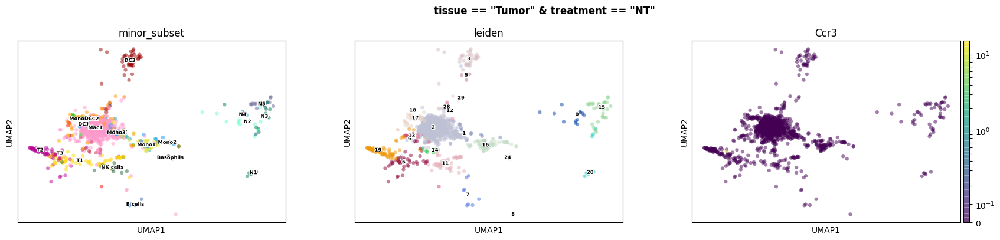

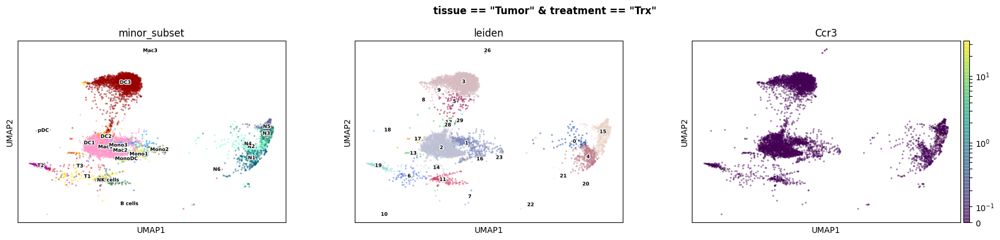

In [32]:
ng.umap_plot(adata, folder='figures/leiden_annotation', color=['minor_subset', 'leiden', 'Ccr3'], return_fig=True, save_fig=False, alpha=0.5, ncols=4, split_by_cats=['tissue', 'treatment'])
 